# Generating Handwritten Tamil characters using GAN
The purpose of the project is to generate handwritten Tamil characters using GAN. Even though GAN has been used to generate numeric digits and English alphabets, generating handwritten characters in Tamil is complex because of the number of classes involved. This implementation uses Tamil handwritten characters dataset http://shiftleft.com/mirrors/www.hpl.hp.com/india/research/penhw-resources/tamil-iwfhr06-train.html



In [1]:
data_dir = './data'

import helper


## Explore the Data
### MNIST
The [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. Let us explore some data

250880
./data


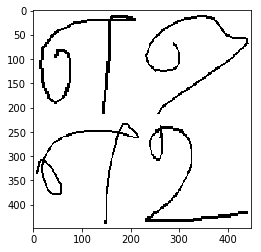

In [2]:
show_n_images = 5

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot
import tensorflow as tf


tamilchars_images = helper.get_batch(glob(os.path.join(data_dir, 'tamil/*.tiff'))[:show_n_images], 224, 224, 'L')
print(tamilchars_images.size)
print(data_dir)
pyplot.imshow(helper.images_square_grid(tamilchars_images, 'L'), cmap='gray')

In [3]:
import numpy as np
np.max(tamilchars_images[0])

255.0

## Build the Neural Network
The LSGAN is built by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Input
The `model_inputs` function creates TF Placeholders for the Neural Network. It will create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

The function will return the placeholders in the tuple (tensor of real input images, tensor of z data)

In [4]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width,image_height,image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    inputs_learning_rate = tf.placeholder(tf.float32, name='input_learning_rate')

    return inputs_real, inputs_z, inputs_learning_rate


### Discriminator
The `discriminator` function is used to create a discriminator neural network that discriminates on `images`.  This function will be able to reuse the variables in the neural network. The function will return a tensor logits of the discriminator.

In [5]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: tensor logits of the discriminator
    """
    alpha=0.2
    with tf.variable_scope('discriminator',reuse=reuse):
        initializer = tf.contrib.layers.xavier_initializer_conv2d(uniform=True, seed=None,
                                                                    dtype=tf.float32)
        
        
        x1=tf.layers.conv2d(images,64,5,strides=2,padding='same', kernel_initializer=initializer)
        x1 = tf.maximum(alpha*x1,x1)
        #print('x1:',x1)
        
        x2=tf.layers.conv2d(x1,128,5,strides=2,padding='same', use_bias=False)
        x2 = tf.layers.batch_normalization(x2,training=True)
        x2 = tf.maximum(alpha*x2,x2)
        #print('x2:',x2)
        
        x3=tf.layers.conv2d(x2,256,5,strides=2,padding='same', use_bias=False)
        x3 = tf.layers.batch_normalization(x3,training=True)
        x3 = tf.maximum(alpha*x3,x3)
        #print('x3:',x3)
        
        x4=tf.layers.conv2d(x3,512,5,strides=2,padding='same', use_bias=False)
        x4 = tf.layers.batch_normalization(x4,training=True)
        x4 = tf.maximum(alpha*x4,x4)
        #print('x4:',x4)

        x4=tf.layers.conv2d(x4,256,5,strides=2,padding='same', use_bias=False)
        x4 = tf.layers.batch_normalization(x4,training=True)
        x4 = tf.maximum(alpha*x4,x4)
        #print('x4:',x4)
        
        flat = tf.reshape(x4,(-1,7*7*256))
        #print('flat:',flat)
         
        logits = tf.layers.dense(flat,1)
        #print('logits:',logits)
    return logits



### Generator
The function `generator` is used to generate an image using `z`. This function will be able to reuse the variables in the neural network.  The function will return the generated 224 x 224 x `out_channel_dim` images.

In [6]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.2
    with tf.variable_scope('generator',reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*1024, use_bias=False)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 1024))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1,x1)  
        #print ('x1:',x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 5, strides=1, padding='same', use_bias=False)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2,x2)
        #print ('x2:',x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 5, strides=2, padding='same', use_bias=False)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3,x3)
        #print ('x3:',x3)
        
        x4 = tf.layers.conv2d_transpose(x3, 128, 5, strides=2, padding='same', use_bias=False)
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha*x4,x4)        
        #print ('x4:',x4)

        x5 = tf.layers.conv2d_transpose(x4, 64, 5, strides=2, padding='same', use_bias=False)
        x2 = tf.layers.batch_normalization(x5, training=is_train)
        x5 = tf.maximum(alpha*x5,x5)
        #print ('x5:',x5)
        
        x6 = tf.layers.conv2d_transpose(x5, 32, 5, strides=2, padding='same', use_bias=False)
        x6 = tf.layers.batch_normalization(x6, training=is_train)
        x6 = tf.maximum(alpha*x6,x6)
        #print ('x6:',x6)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x6, out_channel_dim, 3, strides=2, padding='same', use_bias=False)
        #print ('logits:',logits)
        # 224x224x1 now
        
        out = tf.tanh(logits)
   

    return out

#Test Generator
#tests.test_generator(generator, tf)

### Loss
The function `model_loss` is used to to build the LSGANs for training and calculate the loss.  The function returns a tuple of (discriminator loss, generator loss).

In [7]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
   
    g_model = generator(input_z, out_channel_dim)
    d_out_real = discriminator(input_real)
    d_out_fake = discriminator(g_model,reuse=True)
    
    d_loss = 0.5*tf.reduce_mean(tf.square(d_out_real - 1))+0.5*tf.reduce_mean(tf.square(d_out_fake))
    g_loss = 0.5*tf.reduce_mean(tf.square(d_out_fake-1))
    
    return d_loss, g_loss


### Optimization
The function `model_opt` creates the optimization operations for the GANs. It filters the variables with names that are in the discriminator and generator scope names.  The function returns a tuple of (discriminator training operation, generator training operation).

In [8]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Filter variable names that are in discriminator and generator scope names
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


## Neural Network Training
### Show Output
This function is used to show the current output of the generator during training to help determine how well the LSGANs is training.

In [9]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})
    
    g_model = samples
    g_model = np.resize(samples, (64, 224,224))
    g_model = np.stack((g_model,) * 3, axis=1)

    inceptionscore, stdev = inception_score.get_inception_score(g_model,10)
    print("inc",inceptionscore)
    print("stdev",stdev)
    
    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
The function `train` is used to build and train the LSGANs

In [10]:
import inception_score


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.flatten instead.


In [11]:
%matplotlib inline
import matplotlib.pyplot as plt
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the LSGAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    losses = []
    steps = 0    
    print_every=50
    show_every=50
    
    #model inputs
    inputs_real, inputs_z, inputs_learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    #model loss
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[3])
    #optimizer
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    d_loss_vec=[]
    g_loss_vec=[]

    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images.reshape(batch_size, data_shape[1], data_shape[2], data_shape[3])
                batch_images = batch_images*2
            
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                d = sess.run(d_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, inputs_learning_rate: learning_rate})
                g = sess.run(g_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, inputs_learning_rate: learning_rate})
                g= sess.run(g_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, inputs_learning_rate: learning_rate})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({inputs_z: batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)    
                    
    return               
                

### Tamil Dataset
This section tests the architecture on Tamil dataset.  

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Use keras.layers.batch_normalization instead.
Instructions for updating:
Use keras.layers.conv2d_transpose instead.
Instructions for updating:
Use keras.layers.conv2d instead.
Epoch 2/200... Discriminator Loss: 1.2711... Generator Loss: 0.0516
Inception Score for 64 samples in 10 splits
inc 1.0016636
stdev 0.00039503153


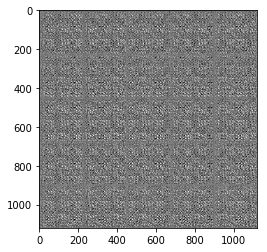

Epoch 3/200... Discriminator Loss: 1.4342... Generator Loss: 0.1468
Inception Score for 64 samples in 10 splits
inc 1.0018377
stdev 0.00045332595


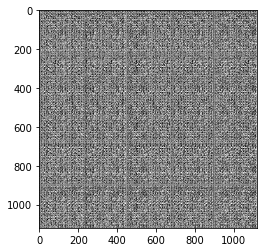

Epoch 4/200... Discriminator Loss: 0.0892... Generator Loss: 0.5057
Inception Score for 64 samples in 10 splits
inc 1.0129449
stdev 0.003984403


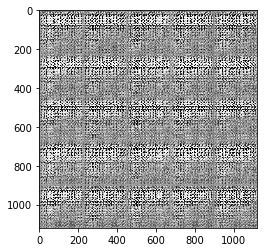

Epoch 5/200... Discriminator Loss: 0.0125... Generator Loss: 0.5609
Inception Score for 64 samples in 10 splits
inc 1.0077779
stdev 0.0020532005


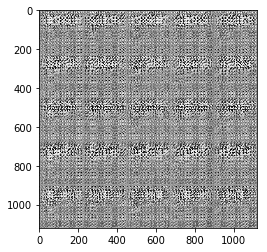

Epoch 6/200... Discriminator Loss: 0.3494... Generator Loss: 1.1666
Inception Score for 64 samples in 10 splits
inc 1.0115564
stdev 0.003258169


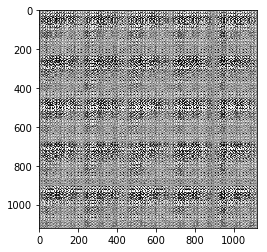

Epoch 7/200... Discriminator Loss: 0.0134... Generator Loss: 0.4690
Inception Score for 64 samples in 10 splits
inc 1.0174892
stdev 0.0043546213


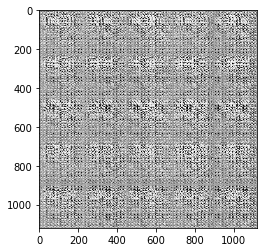

Epoch 8/200... Discriminator Loss: 0.0230... Generator Loss: 0.5155
Inception Score for 64 samples in 10 splits
inc 1.035681
stdev 0.008588762


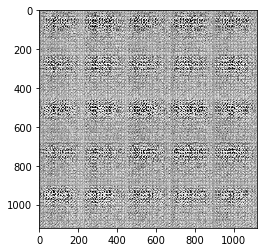

Epoch 9/200... Discriminator Loss: 0.1467... Generator Loss: 0.5362
Inception Score for 64 samples in 10 splits
inc 1.0327059
stdev 0.012378971


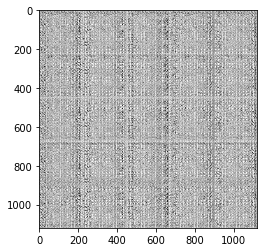

Epoch 10/200... Discriminator Loss: 0.1146... Generator Loss: 0.1811
Inception Score for 64 samples in 10 splits
inc 1.0071869
stdev 0.0034749166


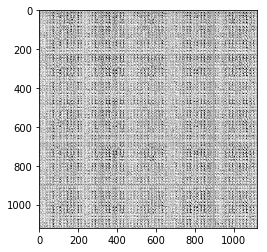

Epoch 11/200... Discriminator Loss: 0.0805... Generator Loss: 0.6162
Inception Score for 64 samples in 10 splits
inc 1.0225421
stdev 0.0045430707


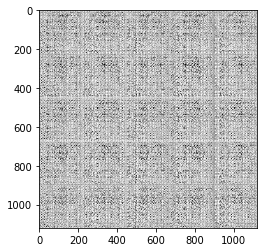

Epoch 12/200... Discriminator Loss: 0.1572... Generator Loss: 0.1416
Inception Score for 64 samples in 10 splits
inc 1.0308055
stdev 0.010434521


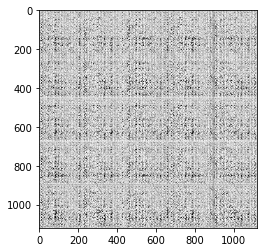

Epoch 14/200... Discriminator Loss: 0.5640... Generator Loss: 0.0075
Inception Score for 64 samples in 10 splits
inc 1.0116098
stdev 0.0022189585


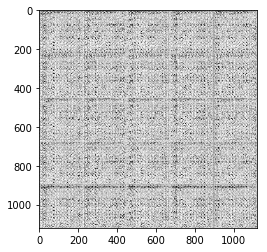

Epoch 15/200... Discriminator Loss: 0.0309... Generator Loss: 0.3360
Inception Score for 64 samples in 10 splits
inc 1.0441236
stdev 0.012762575


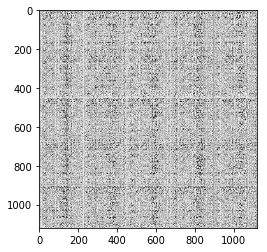

Epoch 16/200... Discriminator Loss: 0.0136... Generator Loss: 0.5476
Inception Score for 64 samples in 10 splits
inc 1.0418892
stdev 0.01097363


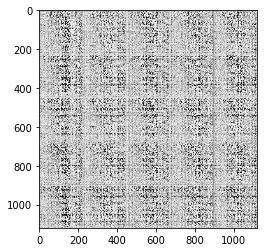

Epoch 17/200... Discriminator Loss: 0.0211... Generator Loss: 0.3878
Inception Score for 64 samples in 10 splits
inc 1.0514863
stdev 0.036502846


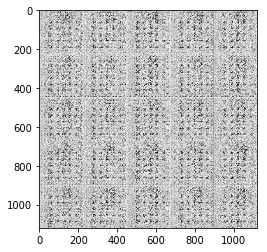

Epoch 18/200... Discriminator Loss: 0.0116... Generator Loss: 0.5732
Inception Score for 64 samples in 10 splits
inc 1.1133184
stdev 0.061618127


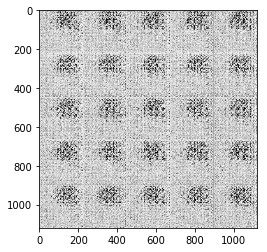

Epoch 19/200... Discriminator Loss: 0.4098... Generator Loss: 1.4466
Inception Score for 64 samples in 10 splits
inc 1.0258489
stdev 0.015000296


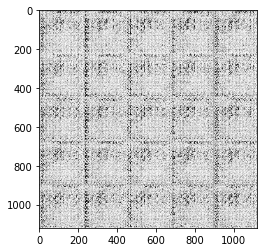

Epoch 20/200... Discriminator Loss: 0.0184... Generator Loss: 0.3735
Inception Score for 64 samples in 10 splits
inc 1.061846
stdev 0.024052685


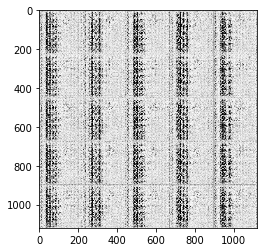

Epoch 21/200... Discriminator Loss: 0.9102... Generator Loss: 2.6243
Inception Score for 64 samples in 10 splits
inc 1.000122
stdev 8.2419094e-05


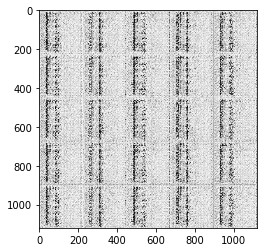

Epoch 22/200... Discriminator Loss: 0.0190... Generator Loss: 0.3609
Inception Score for 64 samples in 10 splits
inc 1.0181111
stdev 0.004120015


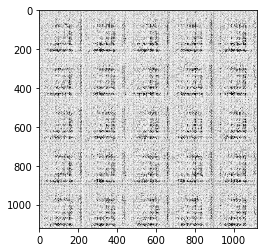

Epoch 23/200... Discriminator Loss: 0.0122... Generator Loss: 0.4721
Inception Score for 64 samples in 10 splits
inc 1.0131018
stdev 0.0030113244


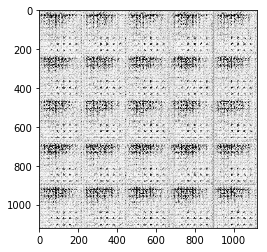

Epoch 24/200... Discriminator Loss: 0.7739... Generator Loss: 0.0188
Inception Score for 64 samples in 10 splits
inc 1.0058802
stdev 0.0007035744


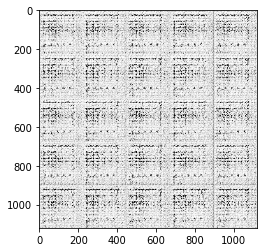

Epoch 25/200... Discriminator Loss: 0.0498... Generator Loss: 0.2713
Epoch 27/200... Discriminator Loss: 0.0359... Generator Loss: 0.5724
Inception Score for 64 samples in 10 splits
inc 1.0064367
stdev 0.0016591448


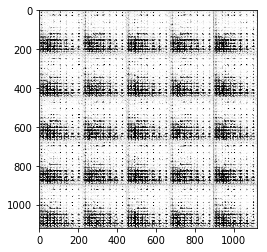

Epoch 28/200... Discriminator Loss: 0.0359... Generator Loss: 0.7040
Inception Score for 64 samples in 10 splits
inc 1.0021557
stdev 0.0005104435


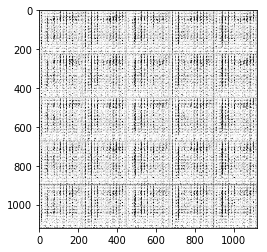

Epoch 29/200... Discriminator Loss: 0.0203... Generator Loss: 0.4537
Inception Score for 64 samples in 10 splits
inc 1.006114
stdev 0.002039558


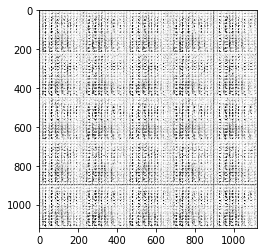

Epoch 30/200... Discriminator Loss: 0.0089... Generator Loss: 0.4852
Inception Score for 64 samples in 10 splits
inc 1.0035231
stdev 0.0010890597


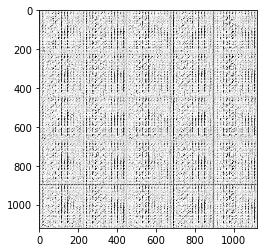

Epoch 31/200... Discriminator Loss: 1.0929... Generator Loss: 0.0518
Inception Score for 64 samples in 10 splits
inc 1.1302822
stdev 0.017889408


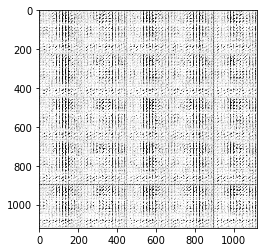

Epoch 32/200... Discriminator Loss: 0.6209... Generator Loss: 2.0517
Inception Score for 64 samples in 10 splits
inc 1.0004145
stdev 0.00017997561


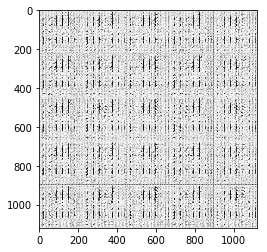

Epoch 33/200... Discriminator Loss: 0.2627... Generator Loss: 0.0657
Inception Score for 64 samples in 10 splits
inc 1.0179936
stdev 0.0053476244


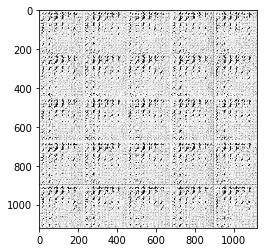

Epoch 34/200... Discriminator Loss: 0.1013... Generator Loss: 0.1616
Inception Score for 64 samples in 10 splits
inc 1.0060873
stdev 0.0012622483


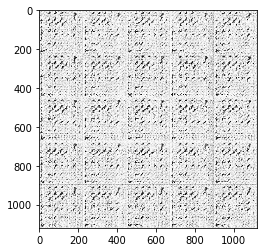

Epoch 35/200... Discriminator Loss: 0.0213... Generator Loss: 0.5233
Inception Score for 64 samples in 10 splits
inc 1.0172733
stdev 0.008553401


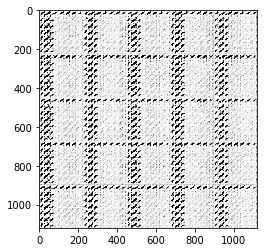

Epoch 36/200... Discriminator Loss: 0.0136... Generator Loss: 0.4165
Inception Score for 64 samples in 10 splits
inc 1.0108111
stdev 0.00079819886


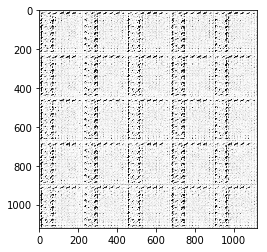

Epoch 37/200... Discriminator Loss: 0.0752... Generator Loss: 0.2601
Inception Score for 64 samples in 10 splits
inc 1.0241091
stdev 0.004033246


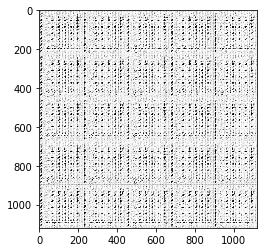

Epoch 39/200... Discriminator Loss: 0.2219... Generator Loss: 1.2085
Inception Score for 64 samples in 10 splits
inc 1.0015436
stdev 0.0005788175


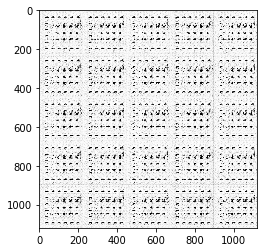

Epoch 40/200... Discriminator Loss: 0.0436... Generator Loss: 0.2791
Inception Score for 64 samples in 10 splits
inc 1.0000403
stdev 2.664441e-05


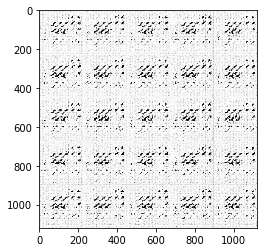

Epoch 41/200... Discriminator Loss: 0.0741... Generator Loss: 0.2091
Inception Score for 64 samples in 10 splits
inc 1.0172714
stdev 0.0039192154


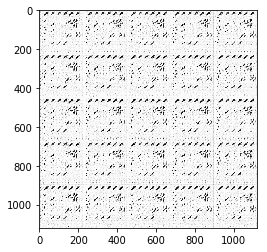

Epoch 42/200... Discriminator Loss: 0.0274... Generator Loss: 0.3490
Inception Score for 64 samples in 10 splits
inc 1.0002185
stdev 5.557837e-05


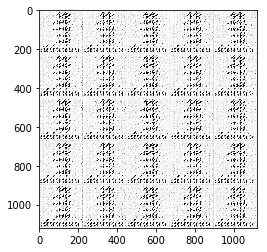

Epoch 43/200... Discriminator Loss: 0.0123... Generator Loss: 0.5640
Inception Score for 64 samples in 10 splits
inc 1.0039066
stdev 0.0014460118


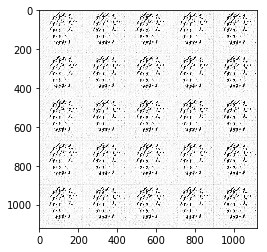

Epoch 44/200... Discriminator Loss: 0.0186... Generator Loss: 0.6583
Inception Score for 64 samples in 10 splits
inc 1.0001087
stdev 3.4608798e-05


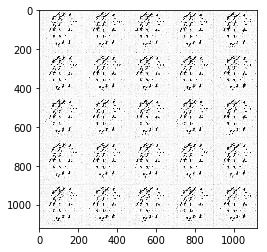

Epoch 45/200... Discriminator Loss: 0.0409... Generator Loss: 0.2836
Inception Score for 64 samples in 10 splits
inc 1.0000756
stdev 3.581522e-05


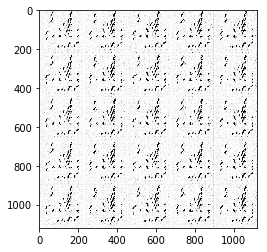

Epoch 46/200... Discriminator Loss: 0.0093... Generator Loss: 0.4868
Inception Score for 64 samples in 10 splits
inc 1.0008801
stdev 0.0008150131


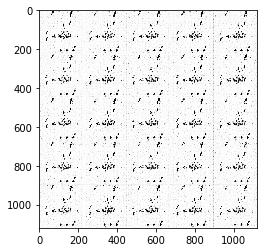

Epoch 47/200... Discriminator Loss: 0.1545... Generator Loss: 0.6215
Inception Score for 64 samples in 10 splits
inc 1.0020727
stdev 0.0004925589


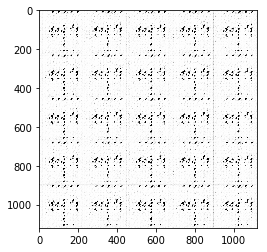

Epoch 48/200... Discriminator Loss: 0.0346... Generator Loss: 0.4693
Inception Score for 64 samples in 10 splits
inc 1.126126
stdev 0.028051965


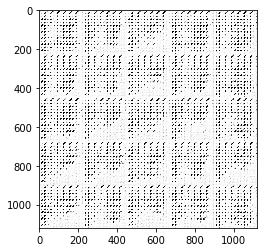

Epoch 49/200... Discriminator Loss: 0.0475... Generator Loss: 0.6286
Inception Score for 64 samples in 10 splits
inc 1.0977371
stdev 0.020049278


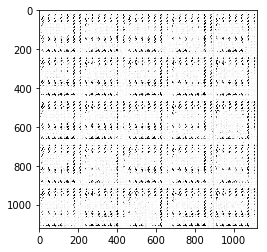

Epoch 50/200... Discriminator Loss: 0.0695... Generator Loss: 0.2541
Inception Score for 64 samples in 10 splits
inc 1.3143209
stdev 0.11476243


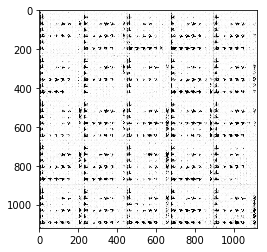

Epoch 52/200... Discriminator Loss: 0.0404... Generator Loss: 0.3115
Inception Score for 64 samples in 10 splits
inc 1.2962389
stdev 0.12506562


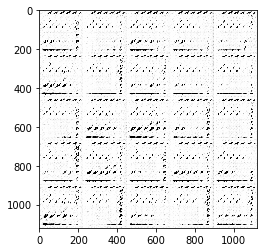

Epoch 53/200... Discriminator Loss: 0.0624... Generator Loss: 0.7260
Inception Score for 64 samples in 10 splits
inc 1.2585464
stdev 0.10898037


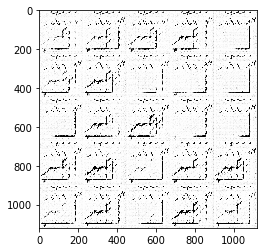

Epoch 54/200... Discriminator Loss: 0.0219... Generator Loss: 0.5066
Inception Score for 64 samples in 10 splits
inc 1.2402997
stdev 0.07993411


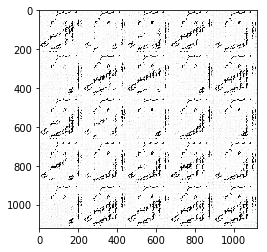

Epoch 55/200... Discriminator Loss: 0.0244... Generator Loss: 0.3755
Inception Score for 64 samples in 10 splits
inc 1.1849295
stdev 0.073429294


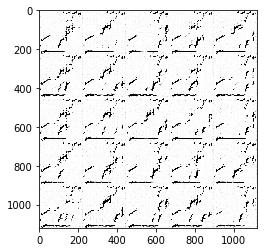

Epoch 56/200... Discriminator Loss: 0.0283... Generator Loss: 0.6430
Inception Score for 64 samples in 10 splits
inc 1.334128
stdev 0.079934426


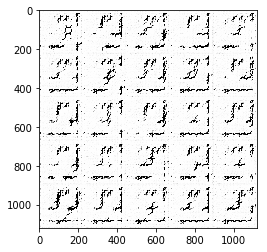

Epoch 57/200... Discriminator Loss: 0.4012... Generator Loss: 0.0310
Inception Score for 64 samples in 10 splits
inc 1.3761116
stdev 0.061884027


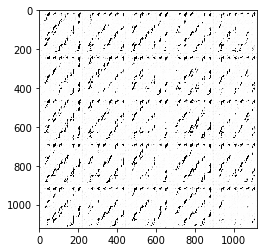

Epoch 58/200... Discriminator Loss: 0.1222... Generator Loss: 0.1796
Inception Score for 64 samples in 10 splits
inc 1.3273976
stdev 0.11606076


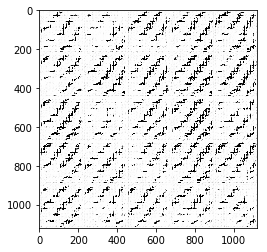

Epoch 59/200... Discriminator Loss: 0.1842... Generator Loss: 0.5942
Inception Score for 64 samples in 10 splits
inc 1.217797
stdev 0.068726994


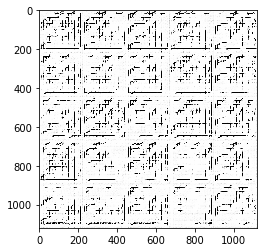

Epoch 60/200... Discriminator Loss: 0.1546... Generator Loss: 0.2188
Inception Score for 64 samples in 10 splits
inc 1.3849839
stdev 0.13096231


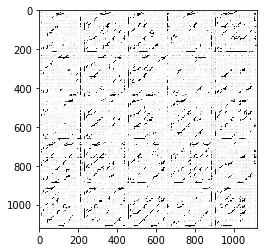

Epoch 61/200... Discriminator Loss: 0.3851... Generator Loss: 0.0282
Inception Score for 64 samples in 10 splits
inc 1.3659633
stdev 0.10100962


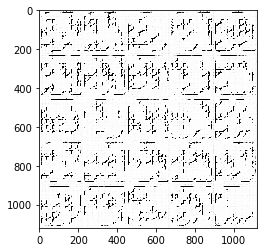

Epoch 62/200... Discriminator Loss: 0.1849... Generator Loss: 0.0981
Inception Score for 64 samples in 10 splits
inc 1.3118256
stdev 0.07762708


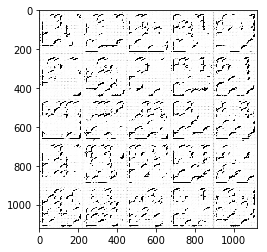

Epoch 64/200... Discriminator Loss: 0.1639... Generator Loss: 0.1269
Inception Score for 64 samples in 10 splits
inc 1.3813528
stdev 0.08594822


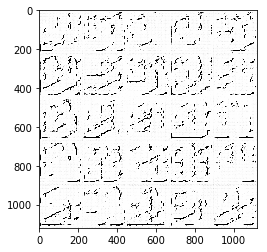

Epoch 65/200... Discriminator Loss: 0.0620... Generator Loss: 0.2500
Inception Score for 64 samples in 10 splits
inc 1.2619877
stdev 0.08751399


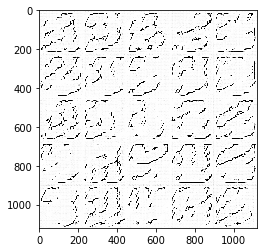

Epoch 66/200... Discriminator Loss: 0.0510... Generator Loss: 0.4166
Inception Score for 64 samples in 10 splits
inc 1.4119322
stdev 0.03755895


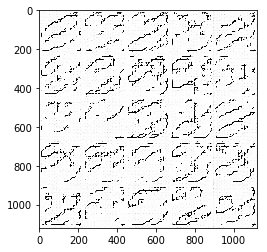

Epoch 67/200... Discriminator Loss: 0.0849... Generator Loss: 0.2202
Inception Score for 64 samples in 10 splits
inc 1.4304035
stdev 0.102913626


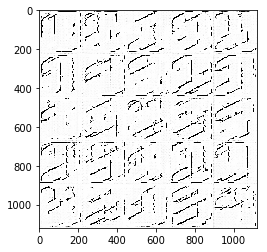

Epoch 68/200... Discriminator Loss: 0.0227... Generator Loss: 0.3813
Inception Score for 64 samples in 10 splits
inc 1.6442566
stdev 0.13832586


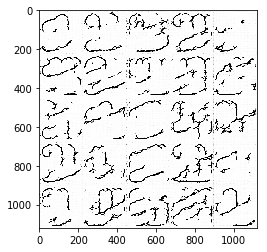

Epoch 69/200... Discriminator Loss: 0.0653... Generator Loss: 0.2297
Inception Score for 64 samples in 10 splits
inc 1.6685492
stdev 0.10987327


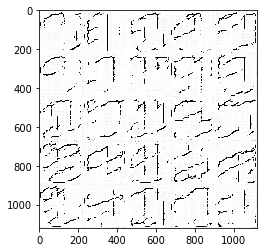

Epoch 70/200... Discriminator Loss: 0.0456... Generator Loss: 0.3019
Inception Score for 64 samples in 10 splits
inc 1.7152382
stdev 0.12965512


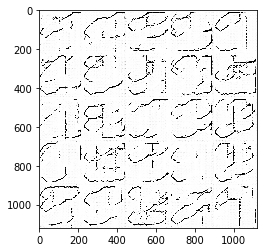

Epoch 71/200... Discriminator Loss: 0.0619... Generator Loss: 0.2701
Inception Score for 64 samples in 10 splits
inc 1.727307
stdev 0.14209248


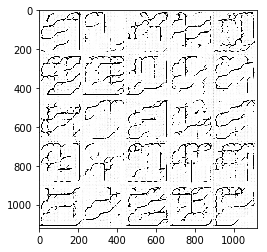

Epoch 72/200... Discriminator Loss: 0.0573... Generator Loss: 0.2485
Inception Score for 64 samples in 10 splits
inc 1.527645
stdev 0.0603342


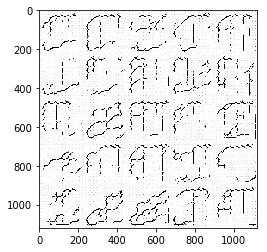

Epoch 73/200... Discriminator Loss: 0.0628... Generator Loss: 0.3164
Inception Score for 64 samples in 10 splits
inc 1.8834206
stdev 0.27801484


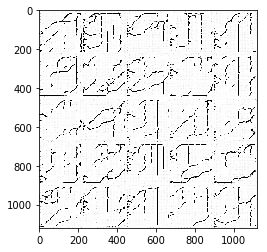

Epoch 74/200... Discriminator Loss: 0.0660... Generator Loss: 0.2501
Inception Score for 64 samples in 10 splits
inc 1.5055058
stdev 0.12483983


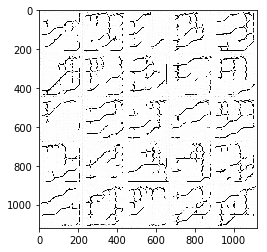

Epoch 75/200... Discriminator Loss: 0.0643... Generator Loss: 0.5738
Inception Score for 64 samples in 10 splits
inc 1.5137718
stdev 0.114437886


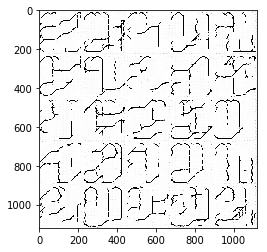

Epoch 77/200... Discriminator Loss: 0.0218... Generator Loss: 0.4940
Inception Score for 64 samples in 10 splits
inc 1.6339114
stdev 0.2761691


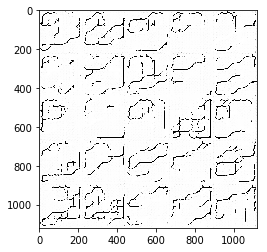

Epoch 78/200... Discriminator Loss: 0.0677... Generator Loss: 0.2383
Inception Score for 64 samples in 10 splits
inc 1.8162575
stdev 0.17614737


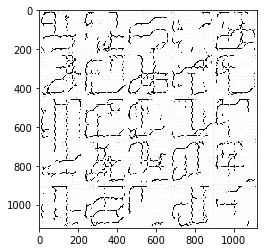

Epoch 79/200... Discriminator Loss: 0.2016... Generator Loss: 0.0998
Inception Score for 64 samples in 10 splits
inc 1.5625411
stdev 0.12140783


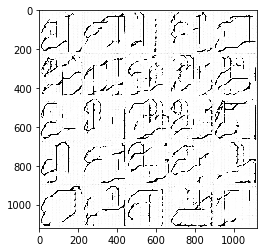

Epoch 80/200... Discriminator Loss: 0.1191... Generator Loss: 0.7615
Inception Score for 64 samples in 10 splits
inc 1.4834192
stdev 0.16710536


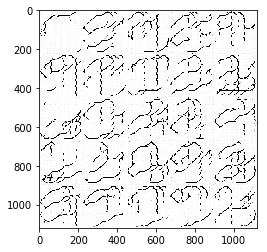

Epoch 81/200... Discriminator Loss: 0.1569... Generator Loss: 0.2210
Inception Score for 64 samples in 10 splits
inc 1.3450332
stdev 0.030207733


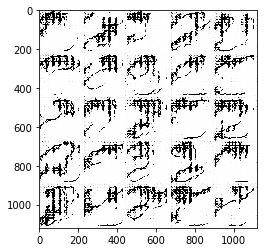

Epoch 82/200... Discriminator Loss: 0.0459... Generator Loss: 0.3551
Inception Score for 64 samples in 10 splits
inc 1.5452282
stdev 0.15349586


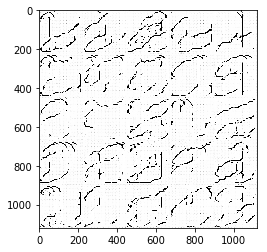

Epoch 83/200... Discriminator Loss: 0.0905... Generator Loss: 0.2040
Inception Score for 64 samples in 10 splits
inc 1.5264066
stdev 0.19211851


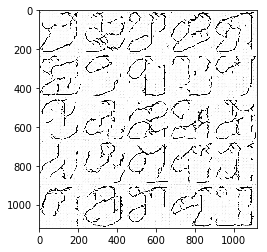

Epoch 84/200... Discriminator Loss: 0.4263... Generator Loss: 0.0285
Inception Score for 64 samples in 10 splits
inc 1.8732218
stdev 0.37121263


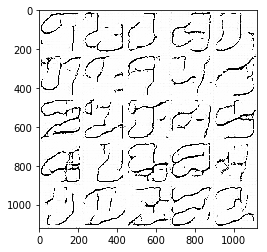

Epoch 85/200... Discriminator Loss: 0.0542... Generator Loss: 0.3834
Inception Score for 64 samples in 10 splits
inc 1.6273426
stdev 0.1714314


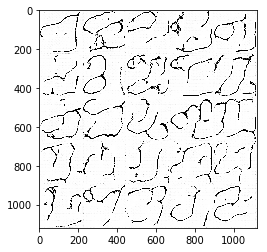

Epoch 86/200... Discriminator Loss: 0.0600... Generator Loss: 0.4774
Inception Score for 64 samples in 10 splits
inc 1.7097142
stdev 0.16650897


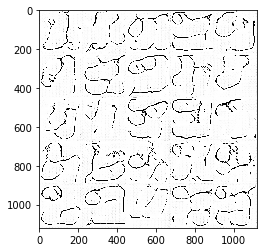

Epoch 87/200... Discriminator Loss: 0.0203... Generator Loss: 0.4196
Inception Score for 64 samples in 10 splits
inc 1.8085239
stdev 0.26363087


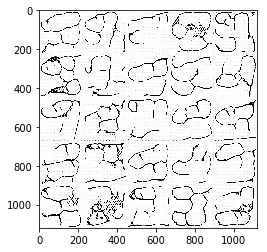

Epoch 89/200... Discriminator Loss: 0.0658... Generator Loss: 0.2752
Inception Score for 64 samples in 10 splits
inc 1.6232103
stdev 0.13377464


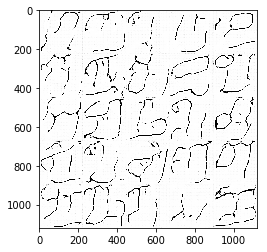

Epoch 90/200... Discriminator Loss: 0.1375... Generator Loss: 0.1635
Inception Score for 64 samples in 10 splits
inc 1.7138313
stdev 0.18776265


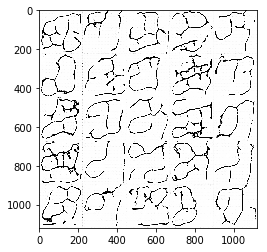

Epoch 91/200... Discriminator Loss: 0.0763... Generator Loss: 0.2982
Inception Score for 64 samples in 10 splits
inc 1.7723144
stdev 0.31011698


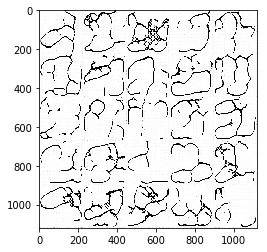

Epoch 92/200... Discriminator Loss: 0.1804... Generator Loss: 0.3899
Inception Score for 64 samples in 10 splits
inc 1.8096664
stdev 0.39357844


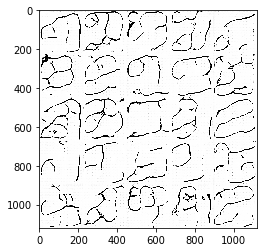

Epoch 93/200... Discriminator Loss: 0.0415... Generator Loss: 0.4366
Inception Score for 64 samples in 10 splits
inc 1.6236718
stdev 0.16252792


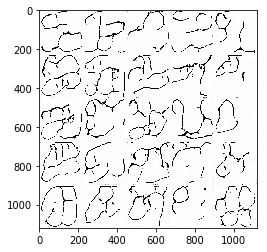

Epoch 94/200... Discriminator Loss: 0.0330... Generator Loss: 0.3053
Inception Score for 64 samples in 10 splits
inc 1.6255497
stdev 0.16465585


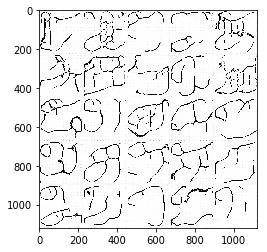

Epoch 95/200... Discriminator Loss: 0.1920... Generator Loss: 0.1001
Inception Score for 64 samples in 10 splits
inc 1.7466764
stdev 0.22342293


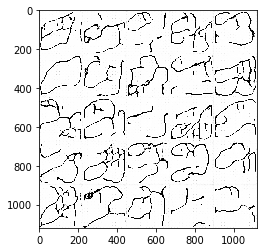

Epoch 96/200... Discriminator Loss: 0.0360... Generator Loss: 0.5792
Inception Score for 64 samples in 10 splits
inc 1.7844359
stdev 0.074124664


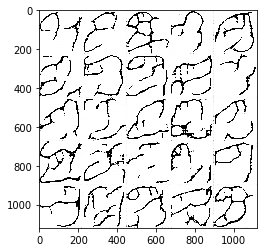

Epoch 97/200... Discriminator Loss: 0.0856... Generator Loss: 0.2093
Inception Score for 64 samples in 10 splits
inc 1.5728437
stdev 0.13957939


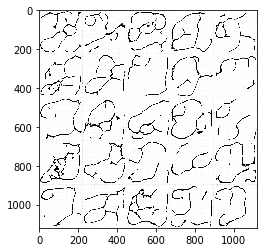

Epoch 98/200... Discriminator Loss: 0.0450... Generator Loss: 0.4899
Inception Score for 64 samples in 10 splits
inc 1.4854673
stdev 0.12360857


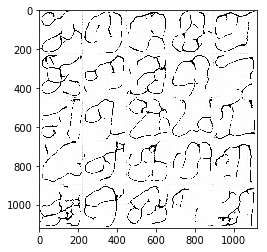

Epoch 99/200... Discriminator Loss: 0.0342... Generator Loss: 0.3437
Inception Score for 64 samples in 10 splits
inc 1.7506459
stdev 0.16047533


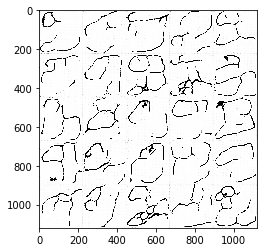

Epoch 100/200... Discriminator Loss: 0.0783... Generator Loss: 0.2180
Inception Score for 64 samples in 10 splits
inc 1.8232222
stdev 0.12964706


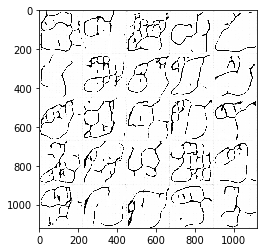

Epoch 102/200... Discriminator Loss: 0.2457... Generator Loss: 0.7048
Inception Score for 64 samples in 10 splits
inc 1.7658002
stdev 0.1938092


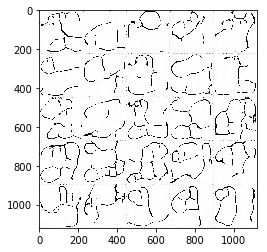

Epoch 103/200... Discriminator Loss: 0.0192... Generator Loss: 0.3657
Inception Score for 64 samples in 10 splits
inc 1.9761966
stdev 0.28698227


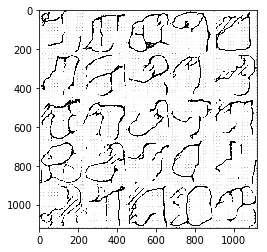

Epoch 104/200... Discriminator Loss: 0.0658... Generator Loss: 0.2960
Inception Score for 64 samples in 10 splits
inc 1.655768
stdev 0.122503236


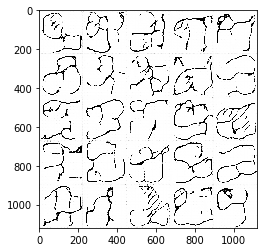

Epoch 105/200... Discriminator Loss: 0.0648... Generator Loss: 0.2504
Inception Score for 64 samples in 10 splits
inc 1.5938212
stdev 0.22810987


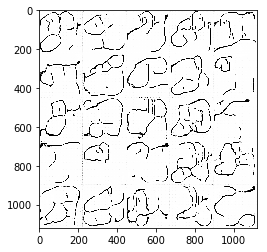

Epoch 106/200... Discriminator Loss: 0.4178... Generator Loss: 0.0784
Inception Score for 64 samples in 10 splits
inc 2.0375037
stdev 0.30245242


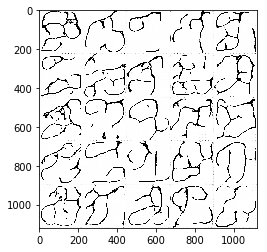

Epoch 107/200... Discriminator Loss: 0.0457... Generator Loss: 0.4559
Inception Score for 64 samples in 10 splits
inc 1.5542212
stdev 0.11865907


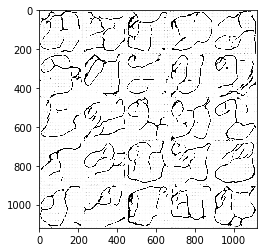

Epoch 108/200... Discriminator Loss: 0.0423... Generator Loss: 0.2913
Inception Score for 64 samples in 10 splits
inc 1.7575709
stdev 0.17178917


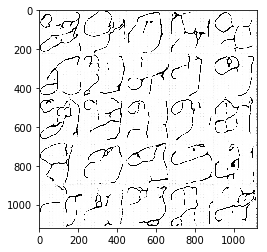

Epoch 109/200... Discriminator Loss: 0.0562... Generator Loss: 0.2472
Inception Score for 64 samples in 10 splits
inc 1.838809
stdev 0.252395


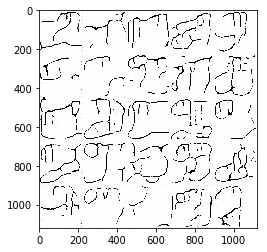

Epoch 110/200... Discriminator Loss: 0.0723... Generator Loss: 0.6214
Inception Score for 64 samples in 10 splits
inc 1.8359783
stdev 0.34685886


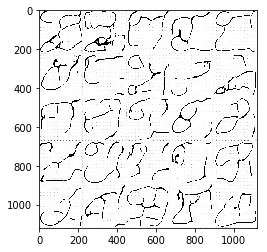

Epoch 111/200... Discriminator Loss: 0.1505... Generator Loss: 0.1314
Inception Score for 64 samples in 10 splits
inc 1.7146814
stdev 0.16644621


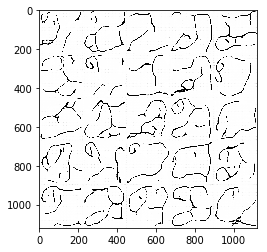

Epoch 112/200... Discriminator Loss: 0.0296... Generator Loss: 0.3412
Inception Score for 64 samples in 10 splits
inc 1.6936562
stdev 0.10919503


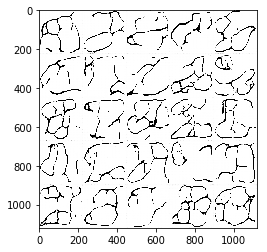

Epoch 114/200... Discriminator Loss: 0.0472... Generator Loss: 0.2798
Inception Score for 64 samples in 10 splits
inc 1.5084019
stdev 0.11075586


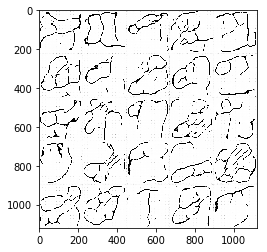

Epoch 115/200... Discriminator Loss: 0.0573... Generator Loss: 0.5930
Inception Score for 64 samples in 10 splits
inc 1.8380762
stdev 0.19366413


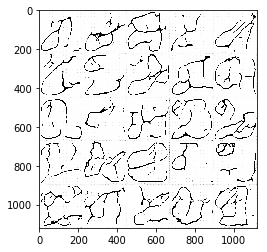

Epoch 116/200... Discriminator Loss: 0.3983... Generator Loss: 0.0786
Inception Score for 64 samples in 10 splits
inc 1.944141
stdev 0.14781986


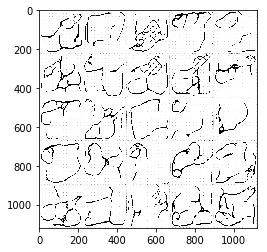

Epoch 117/200... Discriminator Loss: 0.0604... Generator Loss: 0.6531
Inception Score for 64 samples in 10 splits
inc 1.8559895
stdev 0.1986679


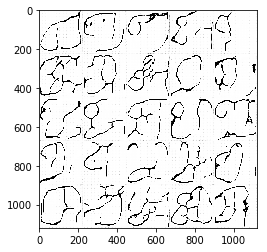

Epoch 118/200... Discriminator Loss: 0.0448... Generator Loss: 0.2831
Inception Score for 64 samples in 10 splits
inc 1.8320271
stdev 0.1114402


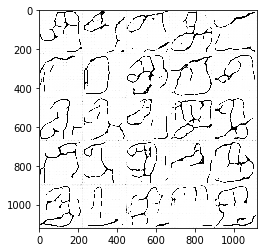

Epoch 119/200... Discriminator Loss: 0.0631... Generator Loss: 0.6279
Inception Score for 64 samples in 10 splits
inc 1.6168697
stdev 0.14187263


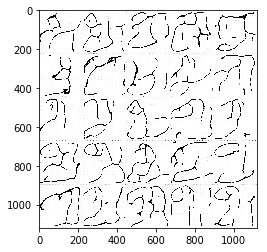

Epoch 120/200... Discriminator Loss: 0.1543... Generator Loss: 0.1334
Inception Score for 64 samples in 10 splits
inc 1.8799452
stdev 0.30602482


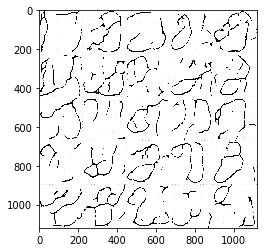

Epoch 121/200... Discriminator Loss: 0.0243... Generator Loss: 0.5147
Inception Score for 64 samples in 10 splits
inc 1.6435795
stdev 0.21221073


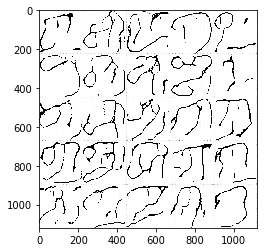

Epoch 122/200... Discriminator Loss: 0.0263... Generator Loss: 0.3409
Inception Score for 64 samples in 10 splits
inc 1.7183402
stdev 0.15188767


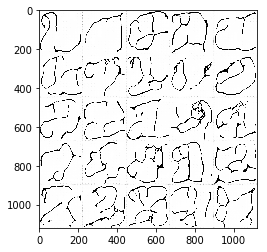

Epoch 123/200... Discriminator Loss: 0.8673... Generator Loss: 0.0885
Inception Score for 64 samples in 10 splits
inc 2.0019486
stdev 0.26718116


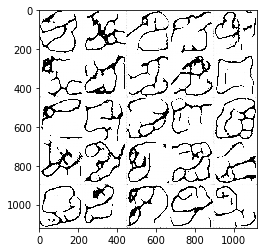

Epoch 124/200... Discriminator Loss: 0.0803... Generator Loss: 0.4580
Inception Score for 64 samples in 10 splits
inc 1.7297637
stdev 0.12897208


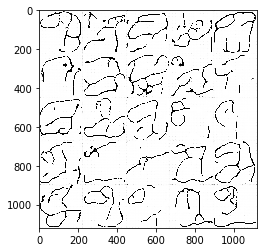

Epoch 125/200... Discriminator Loss: 0.1033... Generator Loss: 0.2299
Inception Score for 64 samples in 10 splits
inc 1.6608372
stdev 0.13703184


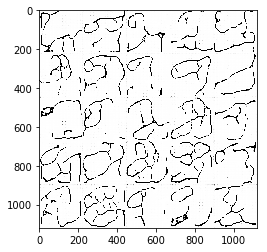

Epoch 127/200... Discriminator Loss: 0.0809... Generator Loss: 0.6378
Inception Score for 64 samples in 10 splits
inc 1.5148498
stdev 0.11218774


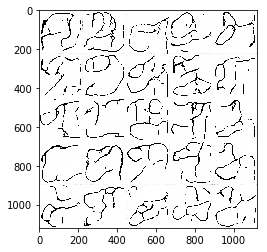

Epoch 128/200... Discriminator Loss: 0.0100... Generator Loss: 0.4404
Inception Score for 64 samples in 10 splits
inc 1.8030716
stdev 0.06600714


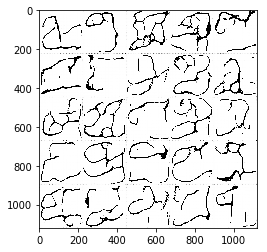

Epoch 129/200... Discriminator Loss: 0.1710... Generator Loss: 0.1935
Inception Score for 64 samples in 10 splits
inc 1.8433806
stdev 0.32090348


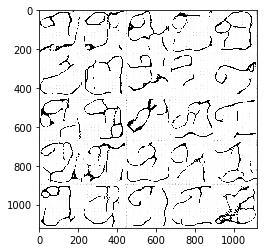

Epoch 130/200... Discriminator Loss: 0.0808... Generator Loss: 0.6971
Inception Score for 64 samples in 10 splits
inc 1.5962919
stdev 0.11180803


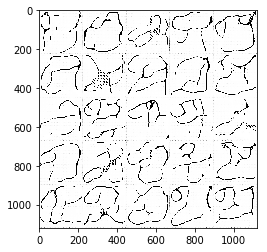

Epoch 131/200... Discriminator Loss: 0.0535... Generator Loss: 0.2909
Inception Score for 64 samples in 10 splits
inc 1.9994266
stdev 0.235357


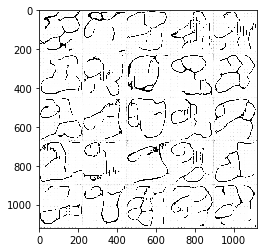

Epoch 132/200... Discriminator Loss: 0.0094... Generator Loss: 0.4813
Inception Score for 64 samples in 10 splits
inc 1.965712
stdev 0.22461039


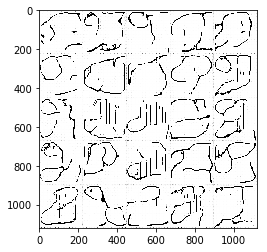

Epoch 133/200... Discriminator Loss: 0.0752... Generator Loss: 0.2983
Inception Score for 64 samples in 10 splits
inc 1.5747015
stdev 0.15699045


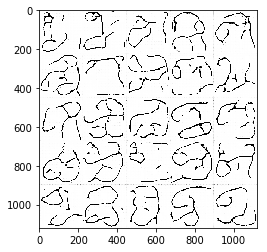

Epoch 134/200... Discriminator Loss: 0.1147... Generator Loss: 0.1774
Inception Score for 64 samples in 10 splits
inc 1.5341308
stdev 0.095088


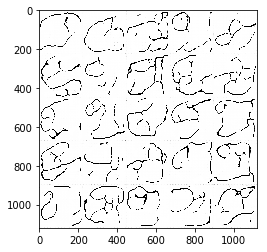

Epoch 135/200... Discriminator Loss: 0.0154... Generator Loss: 0.6012
Inception Score for 64 samples in 10 splits
inc 1.6162676
stdev 0.15553638


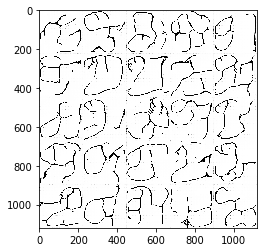

Epoch 136/200... Discriminator Loss: 0.0146... Generator Loss: 0.3899
Inception Score for 64 samples in 10 splits
inc 2.060988
stdev 0.4349203


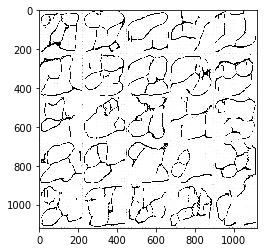

Epoch 137/200... Discriminator Loss: 0.0135... Generator Loss: 0.3821
Inception Score for 64 samples in 10 splits
inc 1.599561
stdev 0.104764335


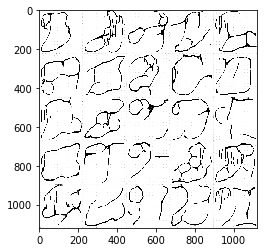

Epoch 139/200... Discriminator Loss: 0.0174... Generator Loss: 0.4161
Inception Score for 64 samples in 10 splits
inc 1.713131
stdev 0.1284601


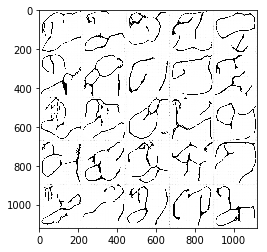

Epoch 140/200... Discriminator Loss: 0.0702... Generator Loss: 0.2617
Inception Score for 64 samples in 10 splits
inc 1.664203
stdev 0.20428342


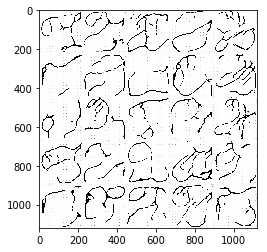

Epoch 141/200... Discriminator Loss: 0.3798... Generator Loss: 0.0460
Inception Score for 64 samples in 10 splits
inc 1.7643211
stdev 0.2796345


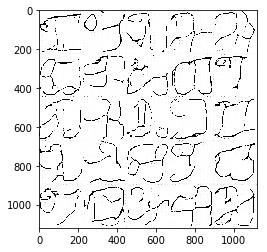

Epoch 142/200... Discriminator Loss: 0.0583... Generator Loss: 0.4364
Inception Score for 64 samples in 10 splits
inc 1.6053448
stdev 0.109025724


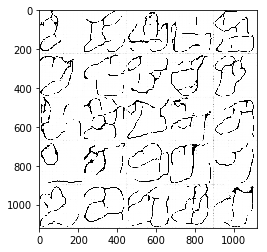

Epoch 143/200... Discriminator Loss: 0.0055... Generator Loss: 0.4384
Inception Score for 64 samples in 10 splits
inc 1.88029
stdev 0.19105828


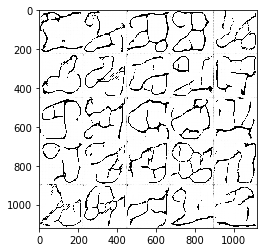

Epoch 144/200... Discriminator Loss: 0.0474... Generator Loss: 0.5839
Inception Score for 64 samples in 10 splits
inc 1.9100403
stdev 0.29981005


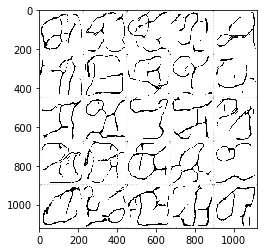

Epoch 145/200... Discriminator Loss: 0.2878... Generator Loss: 0.5094
Inception Score for 64 samples in 10 splits
inc 1.7061987
stdev 0.17473234


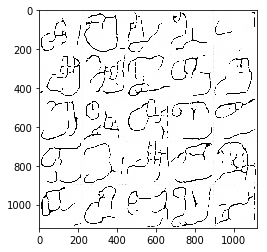

Epoch 146/200... Discriminator Loss: 0.0962... Generator Loss: 0.1976
Inception Score for 64 samples in 10 splits
inc 1.630325
stdev 0.12957184


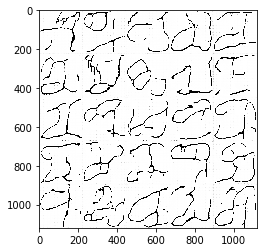

Epoch 147/200... Discriminator Loss: 0.1355... Generator Loss: 0.3125
Inception Score for 64 samples in 10 splits
inc 1.790891
stdev 0.34328476


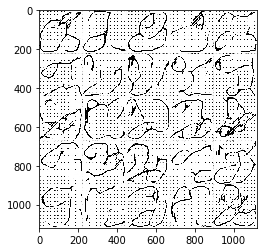

Epoch 148/200... Discriminator Loss: 0.0071... Generator Loss: 0.4499
Inception Score for 64 samples in 10 splits
inc 1.6379035
stdev 0.20976813


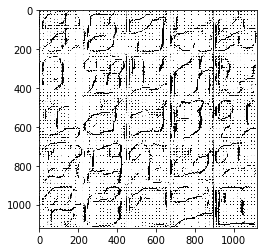

Epoch 149/200... Discriminator Loss: 0.3073... Generator Loss: 0.1532
Inception Score for 64 samples in 10 splits
inc 2.1270704
stdev 0.34918287


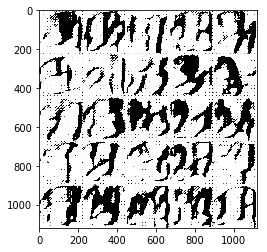

Epoch 150/200... Discriminator Loss: 0.1410... Generator Loss: 0.1655
Inception Score for 64 samples in 10 splits
inc 1.5021977
stdev 0.07549191


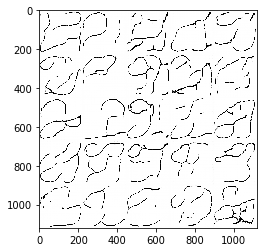

Epoch 152/200... Discriminator Loss: 0.0269... Generator Loss: 0.3909
Inception Score for 64 samples in 10 splits
inc 1.5704442
stdev 0.045216672


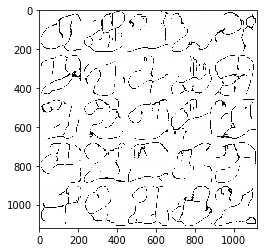

Epoch 153/200... Discriminator Loss: 0.0901... Generator Loss: 0.2613
Inception Score for 64 samples in 10 splits
inc 1.7012011
stdev 0.21547338


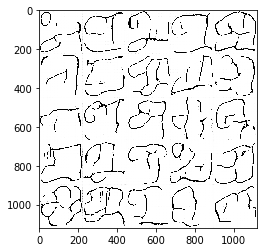

Epoch 154/200... Discriminator Loss: 0.0165... Generator Loss: 0.3660
Inception Score for 64 samples in 10 splits
inc 1.6207044
stdev 0.17038289


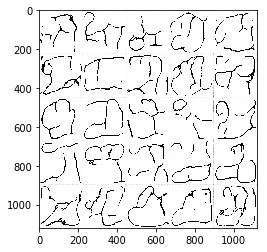

Epoch 155/200... Discriminator Loss: 0.0074... Generator Loss: 0.4414
Inception Score for 64 samples in 10 splits
inc 1.6057789
stdev 0.12951717


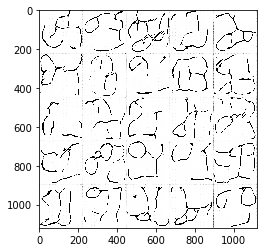

Epoch 156/200... Discriminator Loss: 0.0046... Generator Loss: 0.4447
Inception Score for 64 samples in 10 splits
inc 1.5685927
stdev 0.18832755


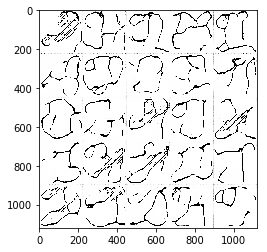

Epoch 157/200... Discriminator Loss: 0.0171... Generator Loss: 0.3561
Inception Score for 64 samples in 10 splits
inc 1.7435299
stdev 0.115038514


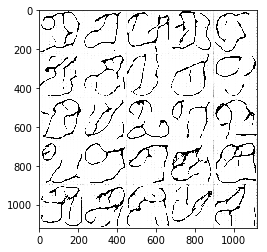

Epoch 158/200... Discriminator Loss: 0.0119... Generator Loss: 0.4788
Inception Score for 64 samples in 10 splits
inc 1.5513977
stdev 0.073722206


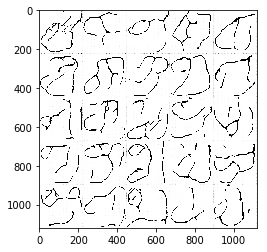

Epoch 159/200... Discriminator Loss: 0.0379... Generator Loss: 0.3089
Inception Score for 64 samples in 10 splits
inc 1.8391024
stdev 0.16992886


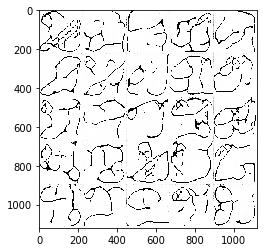

Epoch 160/200... Discriminator Loss: 0.0106... Generator Loss: 0.5249
Inception Score for 64 samples in 10 splits
inc 1.6986077
stdev 0.18174183


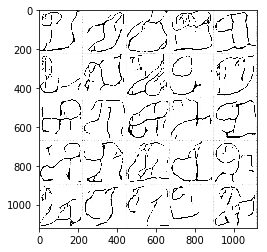

Epoch 161/200... Discriminator Loss: 0.0265... Generator Loss: 0.5672
Inception Score for 64 samples in 10 splits
inc 1.9712759
stdev 0.159609


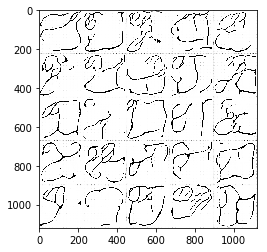

Epoch 162/200... Discriminator Loss: 0.1300... Generator Loss: 0.2215
Inception Score for 64 samples in 10 splits
inc 1.5446997
stdev 0.17581975


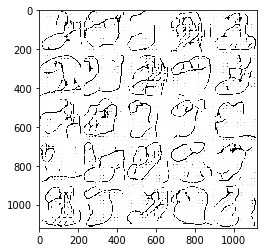

Epoch 164/200... Discriminator Loss: 0.1143... Generator Loss: 0.1656
Inception Score for 64 samples in 10 splits
inc 1.6894093
stdev 0.23341525


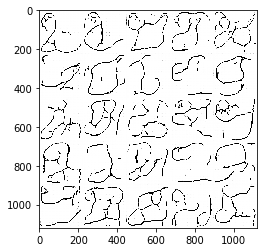

Epoch 165/200... Discriminator Loss: 0.1689... Generator Loss: 0.1366
Inception Score for 64 samples in 10 splits
inc 1.775595
stdev 0.27341205


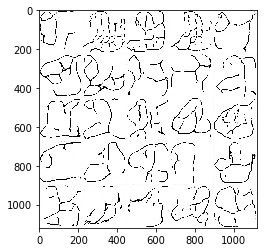

Epoch 166/200... Discriminator Loss: 0.0571... Generator Loss: 0.3299
Inception Score for 64 samples in 10 splits
inc 1.8106425
stdev 0.3123875


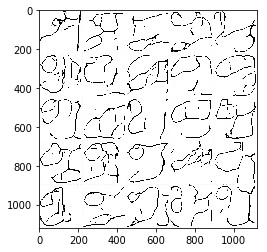

Epoch 167/200... Discriminator Loss: 0.0206... Generator Loss: 0.3796
Inception Score for 64 samples in 10 splits
inc 1.7095633
stdev 0.10950943


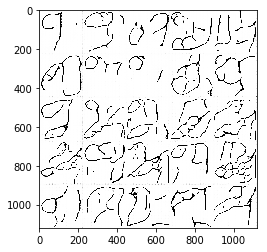

Epoch 168/200... Discriminator Loss: 0.0109... Generator Loss: 0.4260
Inception Score for 64 samples in 10 splits
inc 1.6514244
stdev 0.17852488


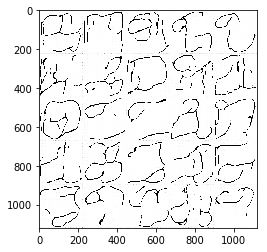

Epoch 169/200... Discriminator Loss: 0.0113... Generator Loss: 0.3921
Inception Score for 64 samples in 10 splits
inc 1.7060716
stdev 0.06573858


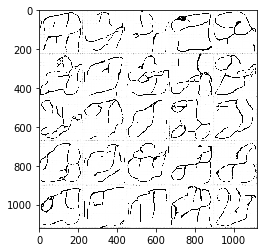

Epoch 170/200... Discriminator Loss: 0.0351... Generator Loss: 0.3732
Inception Score for 64 samples in 10 splits
inc 1.6614231
stdev 0.15877253


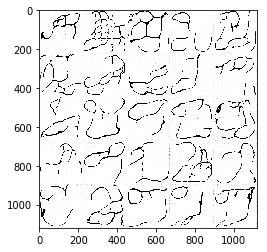

Epoch 171/200... Discriminator Loss: 0.0187... Generator Loss: 0.3419
Inception Score for 64 samples in 10 splits
inc 1.8299656
stdev 0.12829438


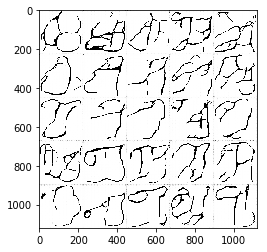

Epoch 172/200... Discriminator Loss: 0.0593... Generator Loss: 0.3039
Inception Score for 64 samples in 10 splits
inc 2.0441737
stdev 0.49091843


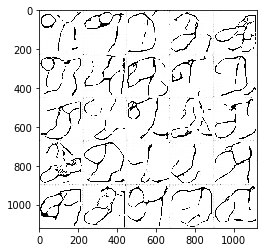

Epoch 173/200... Discriminator Loss: 0.0224... Generator Loss: 0.3541
Inception Score for 64 samples in 10 splits
inc 1.591593
stdev 0.17056936


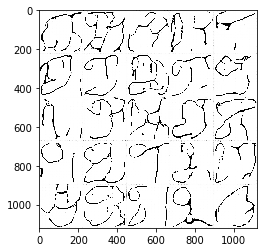

Epoch 174/200... Discriminator Loss: 0.0333... Generator Loss: 0.5361
Inception Score for 64 samples in 10 splits
inc 1.7982185
stdev 0.12859088


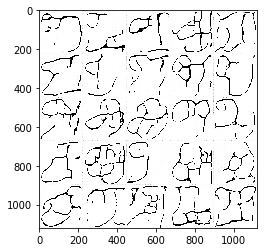

Epoch 175/200... Discriminator Loss: 0.1271... Generator Loss: 0.1773
Inception Score for 64 samples in 10 splits
inc 1.7679342
stdev 0.17237286


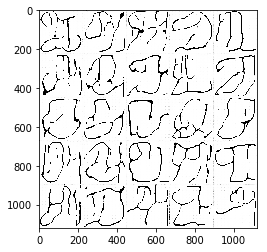

Epoch 177/200... Discriminator Loss: 0.1560... Generator Loss: 0.7727
Inception Score for 64 samples in 10 splits
inc 1.8138692
stdev 0.24488463


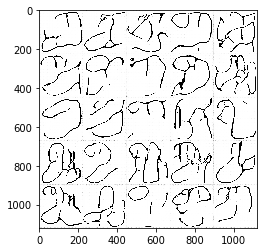

Epoch 178/200... Discriminator Loss: 0.0535... Generator Loss: 0.2743
Inception Score for 64 samples in 10 splits
inc 1.680584
stdev 0.12723462


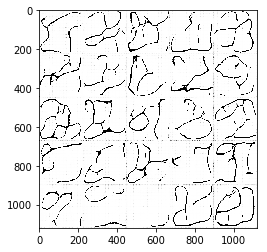

Epoch 179/200... Discriminator Loss: 0.0048... Generator Loss: 0.4399
Inception Score for 64 samples in 10 splits
inc 1.6887195
stdev 0.13741152


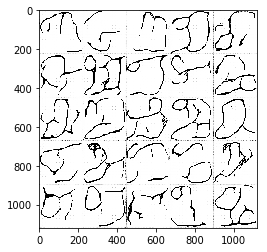

Epoch 180/200... Discriminator Loss: 0.0207... Generator Loss: 0.5636
Inception Score for 64 samples in 10 splits
inc 1.6659269
stdev 0.0722602


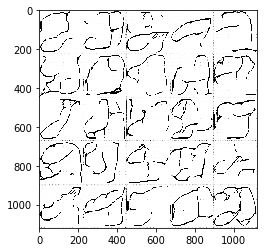

Epoch 181/200... Discriminator Loss: 0.0312... Generator Loss: 0.3541
Inception Score for 64 samples in 10 splits
inc 1.5804454
stdev 0.049221195


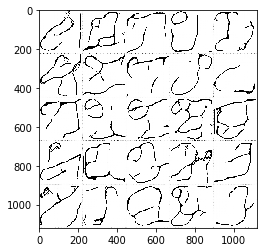

Epoch 182/200... Discriminator Loss: 0.0216... Generator Loss: 0.3758
Inception Score for 64 samples in 10 splits
inc 1.8258085
stdev 0.18977252


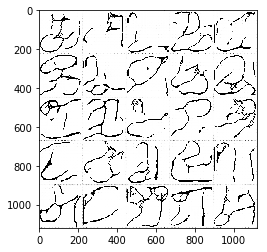

Epoch 183/200... Discriminator Loss: 0.3166... Generator Loss: 0.7573
Inception Score for 64 samples in 10 splits
inc 1.8985035
stdev 0.17098355


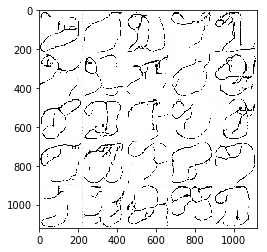

Epoch 184/200... Discriminator Loss: 0.1890... Generator Loss: 0.1383
Inception Score for 64 samples in 10 splits
inc 1.6127535
stdev 0.12561734


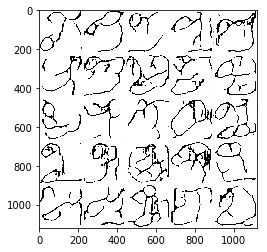

Epoch 185/200... Discriminator Loss: 0.0925... Generator Loss: 0.2712
Inception Score for 64 samples in 10 splits
inc 1.8048385
stdev 0.32454425


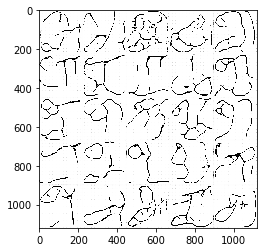

Epoch 186/200... Discriminator Loss: 0.0712... Generator Loss: 0.7181
Inception Score for 64 samples in 10 splits
inc 1.7806156
stdev 0.24044865


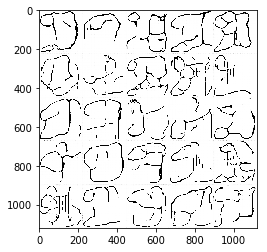

Epoch 187/200... Discriminator Loss: 0.0470... Generator Loss: 0.2764
Inception Score for 64 samples in 10 splits
inc 1.7563496
stdev 0.11527065


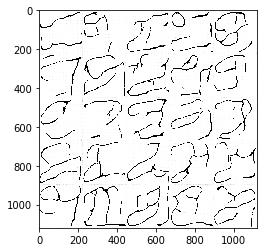

Epoch 189/200... Discriminator Loss: 0.0106... Generator Loss: 0.3980
Inception Score for 64 samples in 10 splits
inc 1.6434071
stdev 0.14606345


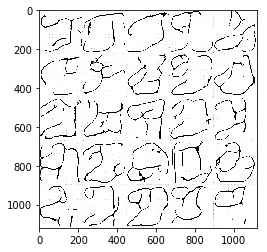

Epoch 190/200... Discriminator Loss: 0.0139... Generator Loss: 0.3732
Inception Score for 64 samples in 10 splits
inc 1.9266007
stdev 0.3109039


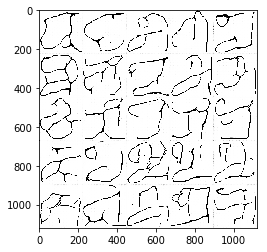

Epoch 191/200... Discriminator Loss: 0.1294... Generator Loss: 0.5066
Inception Score for 64 samples in 10 splits
inc 1.8536259
stdev 0.14315455


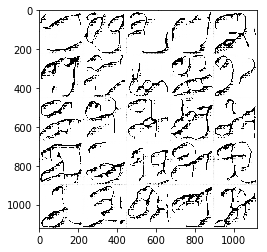

Epoch 192/200... Discriminator Loss: 0.0219... Generator Loss: 0.3724
Inception Score for 64 samples in 10 splits
inc 1.6530424
stdev 0.19661267


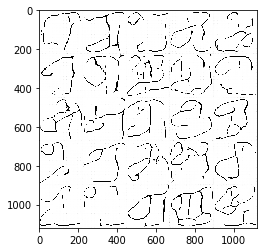

Epoch 193/200... Discriminator Loss: 0.0099... Generator Loss: 0.4415
Inception Score for 64 samples in 10 splits
inc 1.8943455
stdev 0.14611979


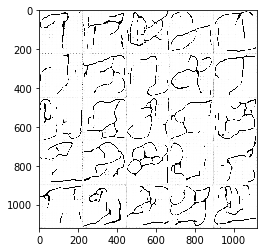

Epoch 194/200... Discriminator Loss: 0.0255... Generator Loss: 0.3738
Inception Score for 64 samples in 10 splits
inc 1.5727623
stdev 0.095758386


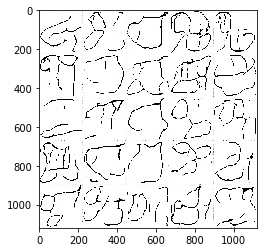

Epoch 195/200... Discriminator Loss: 0.0418... Generator Loss: 0.2845
Inception Score for 64 samples in 10 splits
inc 1.7497625
stdev 0.15786774


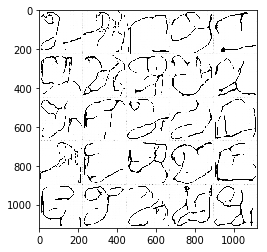

Epoch 196/200... Discriminator Loss: 0.1191... Generator Loss: 0.2093
Inception Score for 64 samples in 10 splits
inc 1.8296369
stdev 0.13676678


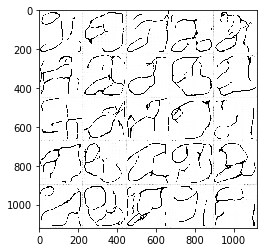

Epoch 197/200... Discriminator Loss: 0.0376... Generator Loss: 0.5421
Inception Score for 64 samples in 10 splits
inc 1.8072197
stdev 0.18590295


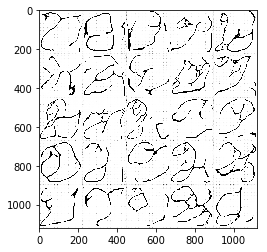

Epoch 198/200... Discriminator Loss: 0.0101... Generator Loss: 0.4979
Inception Score for 64 samples in 10 splits
inc 1.6363837
stdev 0.16549586


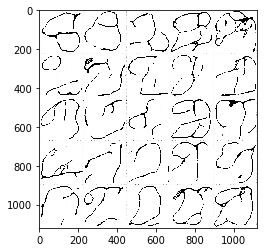

Epoch 199/200... Discriminator Loss: 0.0162... Generator Loss: 0.5069
Inception Score for 64 samples in 10 splits
inc 1.882665
stdev 0.15965582


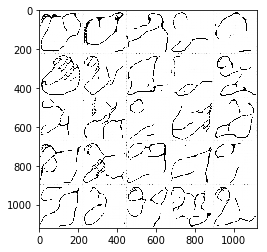

Epoch 200/200... Discriminator Loss: 0.0047... Generator Loss: 0.4402
Inception Score for 64 samples in 10 splits
inc 1.8578551
stdev 0.14656931


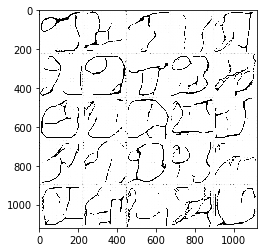

In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5

epochs = 200

tamil_dataset = helper.Dataset('tamil', glob(os.path.join(data_dir, 'tamil/*.tiff')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, tamil_dataset.get_batches,
          tamil_dataset.shape, tamil_dataset.image_mode)

#### Summary
Implemented DCGAN with more convolution layers on Tamil dataset and was able to train the DCGAN